#Neural Decoding - Baseline

##Written by Gergana Slaveykova s1070004
##Radboud University- B3 Thesis project

# Imports

In [ ]:
##Mount Google Drive to acess data and storing purposes
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
#Installs
! pip install mxnet
! pip install nilearn
! pip install nibabel

!pip install git+https://github.com/nipy/nipy.git


In [ ]:
#imports
import pickle
import numpy as np
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

import nibabel as nib
import numpy as np
from nipy.modalities.fmri.experimental_paradigm import load_paradigm_from_csv_file
from nipy.modalities.fmri.design_matrix import make_dmtx
from nipy.labs.viz import plot_map, cm
import matplotlib.pyplot as plt
import pickle

from __future__ import annotations

import os
from types import ModuleType
from typing import Tuple, Union

from nilearn import masking, plotting
from PIL import Image
from scipy.stats import t, zscore
from sklearn.linear_model import RidgeCV


import h5py
import PIL.Image
from scipy import sparse, stats
from scipy.stats import t, zscore
from sklearn.kernel_ridge import KernelRidge
from numpy.linalg import svd
import time
from scipy import signal

from sklearn.linear_model import LinearRegression

# Main Logic

In [ ]:
#Regions of interest
rois = {
        'V1' : 'ROI_V1 = 1',
        'V2' : 'ROI_V2 = 1',
        'V3' : 'ROI_V3 = 1',
        'V4' : 'ROI_V4 = 1',
        'LOC' : 'ROI_LOC = 1',
        'FFA' : 'ROI_FFA = 1',
        'PPA' : 'ROI_PPA = 1'}

rois.keys()

dict_keys(['V1', 'V2', 'V3', 'V4', 'LOC', 'FFA', 'PPA'])

In [ ]:
#Load indices from Voxel selection
file_path = "/content/drive/MyDrive/GOD-NEW-3p/results-correlations/indeces_new_way.dat"
importantind = np.load(file_path,allow_pickle=True)

In [ ]:
import numpy as np
from sklearn.linear_model import LinearRegression
from scipy.stats import t

# Load the latents representations
w_te = np.load("/content/drive/MyDrive/GOD-NEW-3p/latents/t_te_best.npy")
w_tr = np.load("/content/drive/MyDrive/GOD-NEW-3p/latents/t_tr_best.npy")



# Initialize lists for storing the filtered data
x_tr = []
x_te = []

# Load, slice, and filter the brain data
for roi_index, roi in enumerate(rois):
    _roi = np.load(f"/content/drive/MyDrive/GOD-NEW-3p/my_experiment_{roi}_hyperaligned.npy")

    # Slice the training and test sets
    _tr = _roi[:1200]
    _te = _roi[1200:1250]
    helper=importantind
    # Filter using the voxel selection indices
    _tr_filtered = _tr[:, helper[roi_index]]
    _te_filtered = _te[:, helper[roi_index]]

    # Append the filtered data to the lists
    x_tr.append(_tr_filtered)
    x_te.append(_te_filtered)

# Check the shapes of the filtered data
print(len(x_te))
for i in range(len(x_te)):
    print(f"x_te[{i}].shape: {x_te[i].shape}")


7
x_te[0].shape: (50, 1280)
x_te[1].shape: (50, 1257)
x_te[2].shape: (50, 1022)
x_te[3].shape: (50, 695)
x_te[4].shape: (50, 1563)
x_te[5].shape: (50, 1098)
x_te[6].shape: (50, 523)


#All regions

In [ ]:
#Concatenation to create an image of all of them
concat_te = np.concatenate(x_te, axis=1)
print(concat_te.shape)

concat_tr = np.concatenate(x_tr, axis=1)
print(concat_tr.shape)

(50, 7438)
(1200, 7438)


In [ ]:
modelWhole = LinearRegression().fit(concat_tr, w_tr)
y_teWhole = modelWhole.predict(concat_te)

print(y_teWhole.shape)

file_path = "/content/drive/MyDrive/GOD-NEW-3p/results-correlations/filtered-pvalueresultsDecoding/"
# Save the array list to a file

with open(f'{file_path}all_areas_y_te.npy', 'wb') as fp:
            pickle.dump(y_teWhole, fp)

(50, 512)


#LOC

In [ ]:
#Train a linear model for LOC and predict latents
model_loc = LinearRegression().fit(x_tr[4], w_tr)
y_te_loc = model_loc.predict(x_te[4]) # putting as input -> LOC activity
y_tr_loc = model_loc.predict(x_tr[4])
print(y_te_loc.shape)
print(y_tr_loc.shape)


file_path = "/content/drive/MyDrive/GOD-NEW-3p/results-correlations/filtered-pvalueresultsDecoding/"

#Store latents
with open(f'{file_path}not_progressive_y_te_loc.npy', 'wb') as fp:
            pickle.dump(y_te_loc, fp)

(50, 512)
(1200, 512)


#V4

In [ ]:
#Train a linear model for V4 and predict latents
model_v4 = LinearRegression().fit(x_tr[3], w_tr)
y_te_v4 = model_v4.predict(x_te[3]) # putting as input -> V4 activity
y_tr_v4 = model_v4.predict(x_tr[3])
y_te_v4.shape, y_tr_v4.shape

#Store latents
with open(f'{file_path}not_progressive_y_te_v4.npy', 'wb') as fp:
            pickle.dump(y_te_v4, fp)

#V3

In [ ]:
#Train a linear model for V3 and predict latents
x_tr_v3=x_tr[2]
x_te_v3=x_te[2]
model_v3 = LinearRegression().fit(x_tr_v3, w_tr)
y_te_v3 = model_v3.predict(x_te_v3) # putting as input -> V4 activity
y_tr_v3 = model_v3.predict(x_tr_v3)
y_te_v3.shape, y_tr_v3.shape

with open(f'{file_path}not_progressive_y_te_v3.npy', 'wb') as fp:
            pickle.dump(y_te_v3, fp)

#V2

In [ ]:
#Train a linear model for V2 and predict latents
x_tr_v2=x_tr[1]
x_te_v2=x_te[1]
model_v2 = LinearRegression().fit(x_tr_v2, w_tr)
y_te_v2 = model_v2.predict(x_te_v2) # putting as input -> V4 activity
y_tr_v2 = model_v2.predict(x_tr_v2)
y_te_v2.shape, y_tr_v2.shape

#Store latents
with open(f'{file_path}not_progressive_y_te_v2.npy', 'wb') as fp:
            pickle.dump(y_te_v2, fp)

#V1

In [ ]:
#Train a linear model for V1 and predict latents
x_tr_v1=x_tr[0]
x_te_v1=x_te[0]
model_v1 = LinearRegression().fit(x_tr_v1, w_tr)
y_te_v1 = model_v1.predict(x_te_v1) # putting as input -> V4 activity
y_tr_v1 = model_v1.predict(x_tr_v1)
y_te_v1.shape, y_tr_v1.shape

#Store latents
with open(f'{file_path}not_progressive_y_te_v1.npy', 'wb') as fp:
            pickle.dump(y_te_v1, fp)

In [ ]:
def file_index(name):
  """
  Extracts numeric index from a given filename.

  Args:
      name (str): The filename.

  Returns:
      int: The numeric index extracted from the filename.
  """
  return int(''.join(filter(str.isdigit, name)))

['n01443537_22563.JPEG', 'n01621127_19020.JPEG', 'n01677366_18182.JPEG', 'n01846331_17038.JPEG', 'n01858441_11077.JPEG', 'n01943899_24131.JPEG', 'n01976957_13223.JPEG', 'n02071294_46212.JPEG', 'n02128385_20264.JPEG', 'n02139199_10398.JPEG', 'n02190790_15121.JPEG', 'n02274259_24319.JPEG', 'n02416519_12793.JPEG', 'n02437136_12836.JPEG', 'n02437971_5013.JPEG', 'n02690373_7713.JPEG', 'n02797295_15411.JPEG', 'n02824058_18729.JPEG', 'n02882301_14188.JPEG', 'n02916179_24850.JPEG', 'n02950256_22949.JPEG', 'n02951358_23759.JPEG', 'n03064758_38750.JPEG', 'n03122295_31279.JPEG', 'n03124170_13920.JPEG', 'n03237416_58334.JPEG', 'n03272010_11001.JPEG', 'n03345837_12501.JPEG', 'n03379051_8496.JPEG', 'n03452741_24622.JPEG', 'n03455488_28622.JPEG', 'n03482252_22530.JPEG', 'n03495258_9895.JPEG', 'n03584254_5040.JPEG', 'n03626115_19498.JPEG', 'n03710193_22225.JPEG', 'n03716966_28524.JPEG', 'n03761084_43533.JPEG', 'n03767745_109.JPEG', 'n03941684_21672.JPEG', 'n03954393_10038.JPEG', 'n04210120_9062.JPEG',

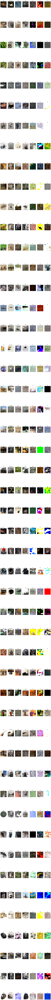

In [ ]:
#regions of interest
titles=["GT","All areas","LOC","V4","V3","V2","V1"]

def plot_images_from_folders(folder_paths,titles):
    """
    Plots images from multiple folders into a grid with titles.

    Args:
        folder_paths (list): List of paths to the folders containing images.
        titles (list): List of titles for each column of images.
    """
    num_cols = len(folder_paths) # Number of columns in the grid
    fig, axes = plt.subplots(50, num_cols, figsize=(15, 6 * 50))  # Create a figure with a grid of subplots
    fig.subplots_adjust(hspace=0.5)  # Adjust vertical spacing
    counter_mine=0  # Counter to handle sorting condition

    for i, folder_path in enumerate(folder_paths):
        # Get list of image files in the folder
        image_files = [f for f in os.listdir(folder_path) if f.endswith('.JPEG') or f.endswith('.png')]

        # Sort image files if counter_mine is not zero
        if counter_mine!=0:
          image_files.sort(key=file_index)
        print(image_files) # Debugging line to print the sorted list of image files
        counter = 0 # Counter to track the current subplot row
        for image_file in image_files:
            # Load and plot the image
            image_path = os.path.join(folder_path, image_file)
            image = Image.open(image_path)
            axes[counter, i].imshow(image)
            axes[counter, i].axis('off')  # Hide the axis

            # Add title to the subplot
            axes[counter, i].set_title(titles[i])

            counter += 1
        counter_mine+=1  # Increment the counter_mine for next folder

    # Hide any remaining empty subplots
    for i in range(counter, 50):
        for j in range(num_cols):
            axes[i, j].axis('off')

    # Show the final figure
    plt.show()

folder_paths = [
    "/content/drive/MyDrive/images/test", #the latents of Thirza are not observed for test
    "/content/drive/MyDrive/GOD-NEW-3p/results-correlations/filtered-pvalueresultsDecoding/WHOLE/",
    "/content/drive/MyDrive/GOD-NEW-3p/results-correlations/filtered-pvalueresultsDecoding/LOC",
    "/content/drive/MyDrive/GOD-NEW-3p/results-correlations/filtered-pvalueresultsDecoding/V4/",
    "/content/drive/MyDrive/GOD-NEW-3p/results-correlations/filtered-pvalueresultsDecoding/V3/",
    "/content/drive/MyDrive/GOD-NEW-3p/results-correlations/filtered-pvalueresultsDecoding/V2/",
    "/content/drive/MyDrive/GOD-NEW-3p/results-correlations/filtered-pvalueresultsDecoding/V1/"
]

plot_images_from_folders(folder_paths)
